In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1.

In [2]:
import json

with open('injury_data_dict.json', 'r', encoding='utf-8') as fp:
    injury_data_dict = json.load(fp)

In [3]:
inj_list = []

acc = 0

for ldict in injury_data_dict.values():
    for pname, plist in ldict.items():
        for inj in plist:
            day_str = inj['days'].split()[0]
            try:
                num = int(day_str)
            except ValueError:
                print(f"球员{pname}存在异常的days值: {inj['days']}")
                acc += 1
                continue
            inj_list.append((inj['injury'], num))

print('总共出现异常值', acc, '次')
del acc
inj_list

球员Jaden Philogene存在异常的days值: ? days
总共出现异常值 1 次


[('Hip problems', 13),
 ('Abdominal problems', 17),
 ('unknown injury', 10),
 ('unknown injury', 22),
 ('Eyebow fracture', 76),
 ('Muscle injury', 27),
 ('Knee injury', 8),
 ('Virus', 17),
 ('Ill', 9),
 ('Ill', 7),
 ('muscular problems', 17),
 ('Facial injury', 3),
 ('Meniscus injury', 30),
 ('Corona virus', 15),
 ('influenza', 8),
 ('Internal ligament strain', 28),
 ('Eye injury', 5),
 ('Hip bruise', 4),
 ('Rib fracture', 54),
 ('Virus', 68),
 ('unknown injury', 17),
 ('unknown injury', 9),
 ('muscle stiffness', 5),
 ('Hip injury', 15),
 ('unknown injury', 30),
 ('Calf injury', 33),
 ('Hamstring injury', 25),
 ('Knock', 40),
 ('Ankle injury', 11),
 ('Appendectomy', 29),
 ('Foot surgery', 84),
 ('muscle stiffness', 5),
 ('Muscle injury', 25),
 ('unknown injury', 17),
 ('Hamstring injury', 35),
 ('Calf injury', 13),
 ('Hamstring injury', 21),
 ('Hamstring muscle injury', 13),
 ('Hamstring injury', 78),
 ('Hamstring injury', 20),
 ('Groin strain', 10),
 ('Groin injury', 13),
 ('Head inju

由于这里的异常days值只有一个，我们直接将其舍弃以保证类型统一，免得后续还要清洗。

In [4]:
len(inj_list)

18745

In [5]:
from collections import defaultdict

# 生成数据列表的字典
d_dict = defaultdict(list)
for injury, value in inj_list:
    d_dict[injury].append(value)

d_dict

defaultdict(list,
            {'Hip problems': [13,
              9,
              23,
              4,
              57,
              15,
              68,
              15,
              3,
              17,
              17,
              18,
              43,
              9,
              46,
              22,
              11,
              6,
              75,
              8,
              8,
              14,
              3,
              7,
              14,
              4,
              106,
              8,
              32,
              19,
              8,
              22,
              10,
              13,
              5,
              107,
              20,
              11,
              12,
              5,
              80,
              13,
              8,
              8,
              20,
              4,
              13,
              23,
              6,
              4,
              17,
              67,
              4,
              8,
             

In [6]:
pd.set_option('display.max_rows', None)

s = pd.Series(inj_list)
vc = s.value_counts()

df = vc.reset_index()
df.columns = ['injury', 'frequency']

df

,injury,frequency
0,"(Ill, 4)",106
1,"(muscular problems, 8)",104
2,"(Corona virus, 8)",98
3,"(Ill, 8)",86
4,"(Corona virus, 15)",85
5,"(Ill, 3)",82
6,"(unknown injury, 6)",81
7,"(Ill, 5)",80
8,"(unknown injury, 5)",78
9,"(muscular problems, 5)",78


In [7]:
df = pd.DataFrame([
    {
        'injury': injury,
        'frequency': len(values),
        'average/day': sum(values) / len(values),
        'max/day': max(values),
        'min/day': min(values),
        'std/day': np.std(values, ddof=0)  # 总体标准差
    }    
    for injury, values in d_dict.items()
])
        
pd.set_option('display.max_rows', None) # 显示所有行
df = df.sort_values(by='frequency', ascending=False).reset_index(drop=True)  # 按频率排序

df

,injury,frequency,average/day,max/day,min/day,std/day
0,Hamstring injury,1334,38.322339,491,1,38.410251
1,unknown injury,1156,20.963668,388,2,26.249872
2,Muscle injury,1031,29.856450,394,2,32.106315
3,muscular problems,921,17.899023,360,1,24.340946
4,Ankle injury,751,39.368842,300,1,41.670108
5,Corona virus,701,12.948645,50,2,6.681906
6,Knee injury,669,51.263079,446,1,61.358557
7,Ill,639,7.984351,130,1,8.408194
8,Knock,585,17.434188,204,1,20.735688
9,Fitness,413,22.871671,333,2,29.000718


In [8]:
df.to_excel('./saved/injury_data.xlsx', index=False, engine='openpyxl')

现在就得到了伤病的统计，保存为xlsx

### 单个伤病的分析

现在我们可以查看令球员闻风丧胆的伤病——十字韧带撕裂的统计数据。

In [9]:
df[df['injury'] == 'Cruciate ligament tear']

,injury,frequency,average/day,max/day,min/day,std/day
20,Cruciate ligament tear,227,227.920705,446,22,73.101841


In [10]:
df[df['injury'].str.startswith('Cruciate ligament', na=False)]

,injury,frequency,average/day,max/day,min/day,std/day
20,Cruciate ligament tear,227,227.920705,446,22,73.101841
73,Cruciate ligament injury,38,202.763158,404,29,105.503663
145,Cruciate ligament surgery,13,217.384615,313,124,50.114543
195,Cruciate ligament strain,6,38.000000,81,11,25.199206


恢复时间为都在200天往上，可以说就是赛季报销了。

十字韧带的伤病类型有4种，把他们合并是不妥的。可以添加“伤病大类”一列，等下再说。

现在绘制回复时间的频率分布图，来让我们更清楚的认识伤病对球员的影响

In [11]:
data1 = d_dict['Cruciate ligament tear']

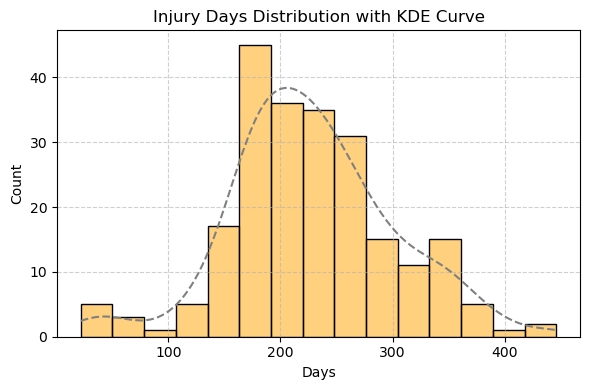

In [12]:
plt.figure(figsize=(6, 4))
ax = sns.histplot(data1, kde=True, bins=15, color='orange')

for line in ax.lines:
    line.set_color('gray')
    line.set_linestyle('--')

plt.title('Injury Days Distribution with KDE Curve')
plt.xlabel('Days')
plt.ylabel('Count')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig(f"./saved/Cruciate ligament tear.png", dpi=300, bbox_inches='tight')
plt.show()

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

def plt_injury_hfd(d_dict, inj, bins=15, figsize=(6, 4)):
    """
        plot the hystogram of frequency distribution of injury
    """
    data = d_dict[inj]
    
    plt.figure(figsize=figsize)
    ax = sns.histplot(data, kde=True, bins=bins, color='orange')
    for line in ax.lines:
        line.set_color('gray')
        line.set_linestyle('--')

    plt.title(f'"{inj}" Days Distribution with KDE Curve')
    plt.xlabel('Days')
    plt.ylabel('Count')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.savefig(f"./saved/{inj}.png", dpi=300, bbox_inches='tight')
    plt.show()

研究频率最高的腘绳肌伤病

In [14]:
df[df['injury'].str.startswith('Hamstring', na=False)]

,injury,frequency,average/day,max/day,min/day,std/day
0,Hamstring injury,1334,38.322339,491,1,38.410251
26,Hamstring muscle injury,175,29.605714,168,6,21.137616
29,Hamstring strain,154,24.071429,126,1,21.128889


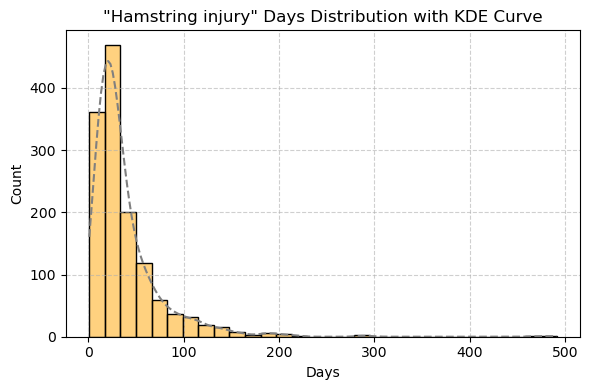

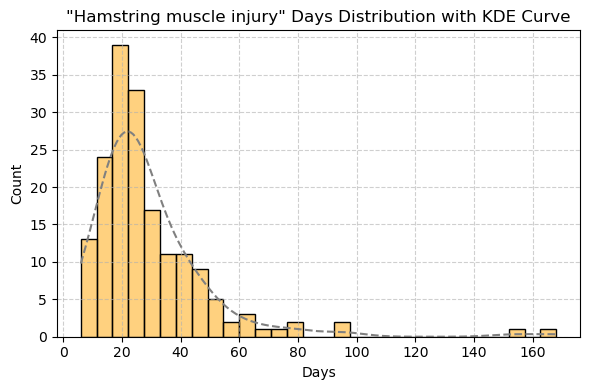

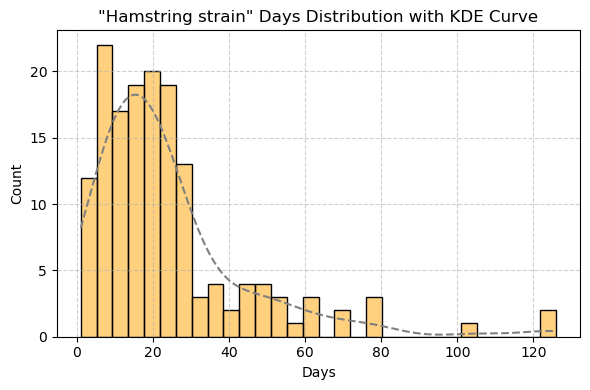

In [15]:
plt_injury_hfd(d_dict, 'Hamstring injury', 30)
plt_injury_hfd(d_dict, 'Hamstring muscle injury', 30)
plt_injury_hfd(d_dict, 'Hamstring strain', 30)

注意到有一个伤病名称叫做"unknown injury"，看似很神秘，我们研究一下

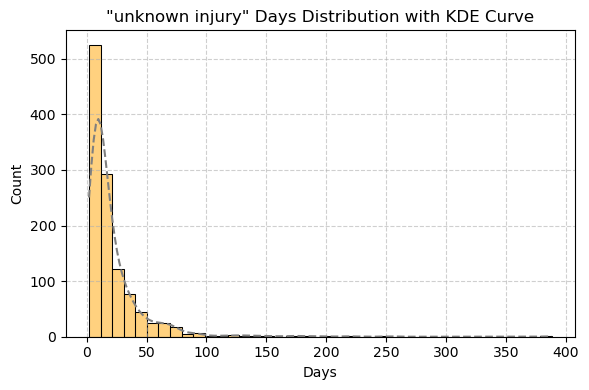

In [16]:
plt_injury_hfd(d_dict, 'unknown injury', 40)

Corona virus

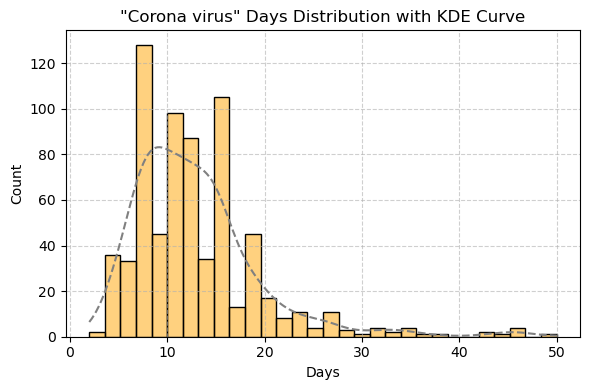

In [17]:
plt_injury_hfd(d_dict, 'Corona virus', 30)

<br>

### 整体分析

In [18]:
df.sort_values(by='average/day', ascending=False).reset_index(drop=True)

,injury,frequency,average/day,max/day,min/day,std/day
0,Cruciate ligament tear,227,227.920705,446,22,73.101841
1,Compression of the spine,3,222.000000,429,4,173.679782
2,Cruciate ligament surgery,13,217.384615,313,124,50.114543
3,Tibia and fibula fracture,3,210.333333,289,92,85.175636
4,Cruciate ligament injury,38,202.763158,404,29,105.503663
5,Achilles tendon rupture,27,194.444444,639,7,122.398055
6,Cartilage damage,10,181.600000,418,63,100.411354
7,Patellar tendon rupture,3,180.333333,288,39,104.404129
8,Partial patellar tendon tear,2,173.000000,265,81,92.000000
9,Lymphatic cancer,3,171.333333,217,112,43.941881


In [19]:
df['injury'].tolist()

['Hamstring injury',
 'unknown injury',
 'Muscle injury',
 'muscular problems',
 'Ankle injury',
 'Corona virus',
 'Knee injury',
 'Ill',
 'Knock',
 'Fitness',
 'Thigh problems',
 'Calf injury',
 'Knee problems',
 'Adductor pain',
 'Torn muscle fiber',
 'Shoulder injury',
 'Foot injury',
 'Adductor injury',
 'Muscle fatigue',
 'Groin injury',
 'Cruciate ligament tear',
 'minor knock',
 'Dead leg',
 'Ankle problems',
 'Rest',
 'Calf problems',
 'Hamstring muscle injury',
 'Back problems',
 'influenza',
 'Hamstring strain',
 'bruise',
 'Ankle sprain',
 'flu',
 'Hip injury',
 'Quarantine',
 'Injury to the ankle',
 'cold',
 'Back injury',
 'Knee surgery',
 'Head injury',
 'Fever',
 'Metatarsal fracture',
 'concussion',
 'Stomach flu',
 'ankle sprain',
 'Meniscus injury',
 'infection',
 'Groin problems',
 'Hip problems',
 'Leg injury',
 'Torn muscle bundle',
 'Achilles tendon problems',
 'Muscle strain',
 'Virus',
 'Inner ligament injury',
 'Foot bruise',
 'strain',
 'Ligament injury',
 'To

用一个关键词-大类映射表，然后用程序自动匹配关键词并标注每条伤病对应的伤病大类（injury_category）

关键词-大类映射表：将`df['injury'].tolist()`的内容喂给ai，由其辅助生成json

In [20]:
import json

with open('keyword_to_category.json', 'r', encoding='utf-8') as fp:
    keyword_to_category = json.load(fp)
    
with open('keyword_to_category_cn.json', 'r', encoding='utf-8') as fp:
    keyword_to_category_cn = json.load(fp)

In [21]:
def categorize_injury_set(name, keyword_to_category):
    words = name.lower().split()
    matched_categories = set()
    for keyword, category in keyword_to_category.items():
        if keyword.lower() in words:
            matched_categories.add(category)
    return matched_categories

def categorize_injury_list(name, keyword_to_category):
    words = name.lower().split()
    matched_categories = []
    for keyword, category in keyword_to_category.items():
        if keyword.lower() in words:
            matched_categories.append(category)
    return matched_categories

In [22]:
categorize_injury_set('Bruise on shinbone', keyword_to_category)

{'Contusion'}

In [23]:
categorize_injury_set('Inflammation in the spine', keyword_to_category_cn)

{'炎症', '背部损伤'}

In [24]:
l1 = list(keyword_to_category_cn.values())
s = pd.Series(l1)
s.value_counts()

疾病      19
肌肉损伤    14
头部损伤    10
上肢损伤    10
背部损伤     7
手术恢复     6
关节损伤     5
身体状况     5
骨折       5
髋部损伤     5
小腿损伤     4
膝部损伤     3
炎症       3
韧带损伤     3
腹部损伤     3
足部损伤     3
踝部损伤     3
神经损伤     2
挫伤       1
肌腱损伤     1
其他内伤     1
心理健康     1
颈部损伤     1
0        1
未知伤病     1
碰撞伤      1
Name: count, dtype: int64

In [25]:
first_in_list = lambda l: l[0] if l else '-'

cis_en = lambda name: categorize_injury_list(name, keyword_to_category)
cis_cn = lambda name: categorize_injury_list(name, keyword_to_category_cn)

cis_en_1 = lambda name: first_in_list(categorize_injury_list(name, keyword_to_category))
cis_cn_1 = lambda name: first_in_list(categorize_injury_list(name, keyword_to_category_cn))

injury_category = df['injury'].apply(cis_cn_1)

df_categorized = df.copy()
df_categorized['injury category'] = injury_category

print(type(injury_category))
print(type(df_categorized))
df_categorized

<class 'pandas.core.series.Series'>
<class 'pandas.core.frame.DataFrame'>


,injury,frequency,average/day,max/day,min/day,std/day,injury category
0,Hamstring injury,1334,38.322339,491,1,38.410251,肌肉损伤
1,unknown injury,1156,20.963668,388,2,26.249872,未知伤病
2,Muscle injury,1031,29.856450,394,2,32.106315,肌肉损伤
3,muscular problems,921,17.899023,360,1,24.340946,肌肉损伤
4,Ankle injury,751,39.368842,300,1,41.670108,踝部损伤
5,Corona virus,701,12.948645,50,2,6.681906,疾病
6,Knee injury,669,51.263079,446,1,61.358557,膝部损伤
7,Ill,639,7.984351,130,1,8.408194,疾病
8,Knock,585,17.434188,204,1,20.735688,碰撞伤
9,Fitness,413,22.871671,333,2,29.000718,身体状况


In [26]:
df_categorized.sort_values(by='injury category', ascending=False).reset_index(drop=True)

,injury,frequency,average/day,max/day,min/day,std/day,injury category
0,Hip injury,134,32.365672,342,3,40.778898,髋部损伤
1,Groin injury,227,31.889868,291,1,37.476468,髋部损伤
2,Pelvic injury,21,34.619048,198,3,47.520899,髋部损伤
3,Hip flexor problems,21,18.333333,86,4,22.273908,髋部损伤
4,Left hip flexor problems,4,19.500000,51,7,18.282505,髋部损伤
5,Groin surgery,38,61.131579,140,15,31.909552,髋部损伤
6,Pubic bone bruise,3,58.666667,102,34,30.739045,髋部损伤
7,Hip problems,81,19.135802,107,2,21.940297,髋部损伤
8,Groin problems,81,22.419753,99,1,25.055920,髋部损伤
9,Right hip flexor problems,6,18.500000,27,6,8.616844,髋部损伤


#### 逐一分析 "-" 项

<figure>
    <left> <img src="images/chart1.png"  alt='missing' width="400"  ><left/>
<figure/>

In [27]:
df_categorized[df_categorized['injury category'].str.startswith('-', na=False)]

,injury,frequency,average/day,max/day,min/day,std/day,injury category
62,Pubalgia,46,54.043478,214,5,46.691381,-
64,Lumbago,41,14.634146,141,3,21.826093,-
65,Capsular injury,41,20.878049,116,1,21.592902,-
76,Bruised ribs,36,17.472222,67,1,16.620747,-
77,stomach problems,35,4.428571,13,1,2.381905,-
111,Stress reaction of the bone,20,20.700000,54,3,15.624020,-
119,heart problems,18,94.611111,321,6,94.007174,-
138,Torn ligaments,14,47.642857,197,12,47.561400,-
139,Chest injury,14,38.214286,112,3,29.174790,-
153,Tendonitis,12,22.166667,78,3,23.712983,-


频数超过100的，逐一修手动修改json

``` json
  "----": 0,
  "unknown injury": "未知伤病",
  "muscular problems": "肌肉损伤",
  "knock": "碰撞伤",
  "quarantine": "疾病"
```

In [28]:
summary = df_categorized.groupby('injury category').agg({
    'frequency': 'sum',
    'average/day': 'mean'
}).reset_index()

# 可选：重命名列名
summary.columns = ['injury category', 'total frequency', 'average/day']

summary = summary.sort_values(by='total frequency', ascending=False).reset_index(drop=True)
summary

,injury category,total frequency,average/day
0,肌肉损伤,6290,28.739661
1,疾病,2304,30.756219
2,膝部损伤,1440,72.319942
3,踝部损伤,1362,51.270708
4,未知伤病,1156,20.963668
5,韧带损伤,994,62.191604
6,碰撞伤,801,12.666168
7,髋部损伤,698,33.897541
8,身体状况,611,34.640834
9,骨折,519,61.410452


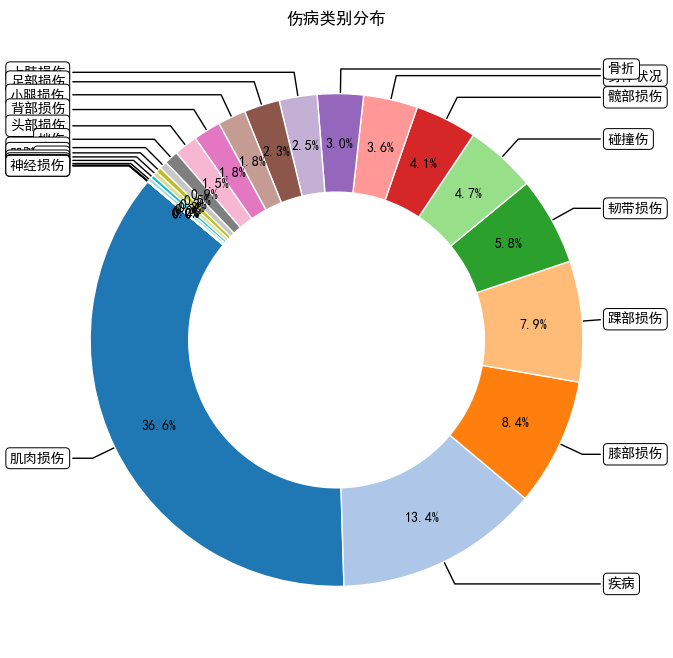

In [29]:
# 假设 summary 是你的原始数据 DataFrame
df = summary

# 删除含有 "-" 和 "未知伤病" 的行
df = df[(df['injury category'] != '-') & (df['injury category'] != '未知伤病')]

# 设置中文字体
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False

# 画饼图
fig, ax = plt.subplots(figsize=(8, 8))
wedges, texts, autotexts = ax.pie(
    df['total frequency'], 
    autopct='%1.1f%%', 
    startangle=140, 
    pctdistance=0.8,
    colors=plt.cm.tab20.colors,
    wedgeprops=dict(width=0.4, edgecolor='w')
)

# 清理默认标签
for text in texts:
    text.set_visible(False)

# 标签和箭头
bbox_props = dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = f"angle,angleA=0,angleB={ang}"
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(
        df['injury category'].iloc[i],  # 用 iloc 确保索引正确
        xy=(x*0.7, y*0.7), 
        xytext=(1.1*np.sign(x), 1.1*y),
        horizontalalignment=horizontalalignment, **kw)

plt.title("伤病类别分布")
plt.savefig(f"./saved/伤病类别分布.png", dpi=300, bbox_inches='tight')
plt.show()

In [30]:
from pyecharts.charts import Pie
from pyecharts import options as opts

# 排序数据
sorted_data = sorted(zip(summary['injury category'], summary['average/day']), key=lambda x: x[1])
formatted_data = [(category, round(value, 2)) for category, value in sorted_data]   # 保留两位小数


pie = Pie()
pie.add(
    "",
    [list(z) for z in formatted_data],
    radius=["20%", "75%"],
    rosetype="radius",
    center=["40%", "50%"]
)

# 设置全局选项
pie.set_global_opts(
    title_opts=opts.TitleOpts(title="伤病玫瑰图-平均天数"),
    tooltip_opts=opts.TooltipOpts(trigger="item", formatter="{b}: {c}  天"),  # 提示框显示
    legend_opts=opts.LegendOpts(
        orient="vertical",   # 设置为垂直布局
        pos_top="middle",    # 设置图例位置靠近顶部
        pos_left="80%",    # 设置图例位置靠右
        item_gap=10,         # 设置图例项之间的间距
        padding=[0, 20, 0, 0]  # 调整图例与饼图之间的间距（上右下左）
    ),
)

# 设置标签的显示选项
pie.set_series_opts(
    label_opts=opts.LabelOpts(
        is_show=True,
        position="outside",  # 标签显示在外部
        font_size=12,         # 字体大小
        formatter="{b}" # 显示标签为分类
    )
)

pie.render("./saved/伤病玫瑰图-平均天数.html")

# 在notebook中显示
pie.render_notebook()

In [31]:
# 排序数据
sorted_data = sorted(zip(summary['injury category'], summary['total frequency']), key=lambda x: x[1])

pie = Pie()
pie.add(
    "",
    [list(z) for z in sorted_data],
    radius=["20%", "75%"],
    rosetype="radius",
    center=["40%", "50%"]
)

# 设置全局选项
pie.set_global_opts(
    title_opts=opts.TitleOpts(title="伤病玫瑰图-频率"),
    tooltip_opts=opts.TooltipOpts(trigger="item", formatter="{b}: {c} ({d}%)"),  # 提示框显示
    legend_opts=opts.LegendOpts(
        orient="vertical",   # 设置为垂直布局
        pos_top="middle",    # 设置图例位置靠近顶部
        pos_left="80%",      # 将图例放到饼图的右边，增加距离
        item_gap=10,         # 设置图例项之间的间距
        padding=[0, 20, 0, 0]  # 调整图例与饼图之间的间距（上右下左）
    ),
)

# 设置标签的显示选项
pie.set_series_opts(
    label_opts=opts.LabelOpts(
        is_show=True,
        position="outside",  # 标签显示在外部
        font_size=12,         # 字体大小
        formatter="{b}: {d}%" # 显示标签为分类和百分比
    )
)

pie.render("./saved/伤病玫瑰图-频率.html")

# 在notebook中显示
pie.render_notebook()

<br>

# 2.

### 导入球员对象 

In [32]:
from player import *
import json

with open("obj_list.json", "r", encoding='utf-8') as fp:
    obj_list = obj_list_from_json(json.load(fp))
    
with open("obj_dict.json", "r", encoding='utf-8') as fp:
    obj_dict = obj_dict_from_json(json.load(fp))

In [33]:
def inj_series(inj):
    return [d.days for d in inj]

data_list = obj_list.copy()
for p in data_list:
    p['injury_history'] = inj_series(p['injury_history'])

data_list

[{'name': 'Ederson',
  'position': 'Goalkeeper',
  'height': '1,88 m',
  'nationality': 'Brazil',
  'injury_history': [-1,
   '30 days',
   397,
   '3 days',
   785,
   '17 days',
   16,
   '7 days',
   16,
   '9 days',
   355,
   '17 days',
   1096,
   '8 days',
   50,
   '27 days',
   39,
   '76 days',
   145,
   '22 days',
   22,
   '10 days',
   32,
   '17 days',
   14,
   '13 days'],
  'apparence': (495, 44035)},
 {'name': 'Stefan Ortega',
  'position': 'Goalkeeper',
  'height': '1,85 m',
  'nationality': 'Germany',
  'injury_history': [-1,
   '54 days',
   447,
   '4 days',
   101,
   '5 days',
   2411,
   '28 days',
   451,
   '8 days',
   666,
   '15 days'],
  'apparence': (401, 35735)},
 {'name': 'Scott Carson',
  'position': 'Goalkeeper',
  'height': '1,88 m',
  'nationality': 'England',
  'injury_history': [-1, '9 days', 34, '17 days', 2837, '68 days'],
  'apparence': (522, 46879)},
 {'name': 'Rúben Dias',
  'position': 'Centre-Back',
  'height': '1,87 m',
  'nationality': '

In [34]:
data_list[0]['injury_history'][1]

'30 days'

In [35]:
def convert_to_int(value):
    if isinstance(value, int):  # 如果是整数，直接返回
        return value
    elif isinstance(value, str):
        parts = value.split() 
        if len(parts) == 2 and parts[1] == 'days':  # 格式是 "X days"
            try:
                return int(parts[0]) 
            except ValueError:
                print(f"Invalid value encountered: {value}, returning 0")
                return 0  # 非法数字字符，直接返回0
        return int(value) 
    return value 

def convert_list_to_int(lst):
    return [convert_to_int(i) for i in lst]

for p in data_list:
    p['injury_history'] = convert_list_to_int(p['injury_history'])
    
data_list

Invalid value encountered: ? days, returning 0


[{'name': 'Ederson',
  'position': 'Goalkeeper',
  'height': '1,88 m',
  'nationality': 'Brazil',
  'injury_history': [-1,
   30,
   397,
   3,
   785,
   17,
   16,
   7,
   16,
   9,
   355,
   17,
   1096,
   8,
   50,
   27,
   39,
   76,
   145,
   22,
   22,
   10,
   32,
   17,
   14,
   13],
  'apparence': (495, 44035)},
 {'name': 'Stefan Ortega',
  'position': 'Goalkeeper',
  'height': '1,85 m',
  'nationality': 'Germany',
  'injury_history': [-1, 54, 447, 4, 101, 5, 2411, 28, 451, 8, 666, 15],
  'apparence': (401, 35735)},
 {'name': 'Scott Carson',
  'position': 'Goalkeeper',
  'height': '1,88 m',
  'nationality': 'England',
  'injury_history': [-1, 9, 34, 17, 2837, 68],
  'apparence': (522, 46879)},
 {'name': 'Rúben Dias',
  'position': 'Centre-Back',
  'height': '1,87 m',
  'nationality': 'Portugal',
  'injury_history': [-1,
   29,
   95,
   11,
   1435,
   40,
   255,
   25,
   654,
   33,
   19,
   30,
   6,
   15,
   6,
   5],
  'apparence': (425, 36453)},
 {'name': 'Abd

### 清洗数据

In [36]:
df = pd.json_normalize(data_list)
df

,name,position,height,nationality,injury_history,apparence
0,Ederson,Goalkeeper,"1,88 m",Brazil,"[-1, 30, 397, 3, 785, 17, 16, 7, 16, 9, 355, 1...","(495, 44035)"
1,Stefan Ortega,Goalkeeper,"1,85 m",Germany,"[-1, 54, 447, 4, 101, 5, 2411, 28, 451, 8, 666...","(401, 35735)"
2,Scott Carson,Goalkeeper,"1,88 m",England,"[-1, 9, 34, 17, 2837, 68]","(522, 46879)"
3,Rúben Dias,Centre-Back,"1,87 m",Portugal,"[-1, 29, 95, 11, 1435, 40, 255, 25, 654, 33, 1...","(425, 36453)"
4,Abdukodir Khusanov,Centre-Back,"1,86 m",Uzbekistan,[-1],"(78, 6292)"
5,Nathan Aké,Centre-Back,"1,80 m",Netherlands,"[-1, 36, 982, 13, 330, 7, 143, 2, 341, 35, 30,...","(363, 28028)"
6,Manuel Akanji,Centre-Back,"1,88 m",Switzerland,"[-1, 40, 65, 302, 648, 23, 10, 9, 10, 7, 14, 1...","(444, 36883)"
7,John Stones,Centre-Back,"1,88 m",England,"[-1, 67, 284, 25, 767, 43, 94, 29, 56, 5, 230,...","(412, 31401)"
8,Vitor Reis,Centre-Back,"1,86 m",Brazil,"[-1, 24]","(42, 3303)"
9,Josko Gvardiol,Left-Back,"1,85 m",Croatia,"[-1, 22, 45, 36, 322, 8, 359, 8, 29, 27, 219, 23]","(250, 19815)"


In [37]:
df['height'] = df['height'].replace('-', np.nan)  # 身高未知的标记为nan
df['height'] = df['height'].str.replace(' m', '').str.replace(',', '.').astype(float)   # 身高列转化为数值
df['height'] = pd.to_numeric(df['height'], errors='coerce')
df.rename(columns={'height': 'height/m'}, inplace=True)  # 重命名列

average_height = df['height/m'].mean()  # 平均身高
average_height

1.8362077012835474

In [38]:
df.to_csv('./saved/players.csv', index=False)
df

,name,position,height/m,nationality,injury_history,apparence
0,Ederson,Goalkeeper,1.88,Brazil,"[-1, 30, 397, 3, 785, 17, 16, 7, 16, 9, 355, 1...","(495, 44035)"
1,Stefan Ortega,Goalkeeper,1.85,Germany,"[-1, 54, 447, 4, 101, 5, 2411, 28, 451, 8, 666...","(401, 35735)"
2,Scott Carson,Goalkeeper,1.88,England,"[-1, 9, 34, 17, 2837, 68]","(522, 46879)"
3,Rúben Dias,Centre-Back,1.87,Portugal,"[-1, 29, 95, 11, 1435, 40, 255, 25, 654, 33, 1...","(425, 36453)"
4,Abdukodir Khusanov,Centre-Back,1.86,Uzbekistan,[-1],"(78, 6292)"
5,Nathan Aké,Centre-Back,1.80,Netherlands,"[-1, 36, 982, 13, 330, 7, 143, 2, 341, 35, 30,...","(363, 28028)"
6,Manuel Akanji,Centre-Back,1.88,Switzerland,"[-1, 40, 65, 302, 648, 23, 10, 9, 10, 7, 14, 1...","(444, 36883)"
7,John Stones,Centre-Back,1.88,England,"[-1, 67, 284, 25, 767, 43, 94, 29, 56, 5, 230,...","(412, 31401)"
8,Vitor Reis,Centre-Back,1.86,Brazil,"[-1, 24]","(42, 3303)"
9,Josko Gvardiol,Left-Back,1.85,Croatia,"[-1, 22, 45, 36, 322, 8, 359, 8, 29, 27, 219, 23]","(250, 19815)"


In [39]:
df[df.isna().any(axis=1)]

,name,position,height/m,nationality,injury_history,apparence
305,Caleb Kporha,Right-Back,NaN,England,[-1],"(38, 2871)"
310,Kaden Rodney,Defensive Midfield,NaN,England,[-1],"(100, 7966)"
457,Cieran Slicker,Goalkeeper,NaN,Scotland,"[-1, 15]","(62, 5387)"
636,Arkaitz Mariezkurrena,Left Winger,NaN,Spain,[-1],"(91, 4719)"
890,Omar Sadik,Centre-Forward,NaN,Morocco,"[-1, 142]","(44, 2664)"
925,Ismael Bekhoucha,Right-Back,NaN,Morocco,[-1],"(67, 3673)"
931,Alberto Risco,Attacking Midfield,NaN,Spain,[-1],"(18, 401)"
1034,Yan Diomande,Left Winger,NaN,Cote d'Ivoire,[-1],"(10, 542)"
1068,Luca Novodomsky,Goalkeeper,NaN,Germany,[-1],"(20, 1733)"
1258,Bazoumana Touré,Left Winger,NaN,Cote d'Ivoire,[-1],"(38, 2337)"


In [40]:
average_height = round(average_height,2)
df_filled = df.fillna({'height/m': average_height})
df_filled.to_csv('./saved/players_filled.csv', index=False)
df_filled

,name,position,height/m,nationality,injury_history,apparence
0,Ederson,Goalkeeper,1.88,Brazil,"[-1, 30, 397, 3, 785, 17, 16, 7, 16, 9, 355, 1...","(495, 44035)"
1,Stefan Ortega,Goalkeeper,1.85,Germany,"[-1, 54, 447, 4, 101, 5, 2411, 28, 451, 8, 666...","(401, 35735)"
2,Scott Carson,Goalkeeper,1.88,England,"[-1, 9, 34, 17, 2837, 68]","(522, 46879)"
3,Rúben Dias,Centre-Back,1.87,Portugal,"[-1, 29, 95, 11, 1435, 40, 255, 25, 654, 33, 1...","(425, 36453)"
4,Abdukodir Khusanov,Centre-Back,1.86,Uzbekistan,[-1],"(78, 6292)"
5,Nathan Aké,Centre-Back,1.80,Netherlands,"[-1, 36, 982, 13, 330, 7, 143, 2, 341, 35, 30,...","(363, 28028)"
6,Manuel Akanji,Centre-Back,1.88,Switzerland,"[-1, 40, 65, 302, 648, 23, 10, 9, 10, 7, 14, 1...","(444, 36883)"
7,John Stones,Centre-Back,1.88,England,"[-1, 67, 284, 25, 767, 43, 94, 29, 56, 5, 230,...","(412, 31401)"
8,Vitor Reis,Centre-Back,1.86,Brazil,"[-1, 24]","(42, 3303)"
9,Josko Gvardiol,Left-Back,1.85,Croatia,"[-1, 22, 45, 36, 322, 8, 359, 8, 29, 27, 219, 23]","(250, 19815)"


In [41]:
df_filled[df_filled.isna().any(axis=1)]

,name,position,height/m,nationality,injury_history,apparence


### 绘制波纹图

In [42]:
def draw_timeline(index, show_labels=True):
    data = df_filled['injury_history'][index].copy()
    data[0] = 0

    it = iter(data)

    y = -1
    Y = []
    path_len = 0
    leng = next(it)
    scale = sum(data)
    for x in range(scale):
        if path_len == leng:  # 检查路程
            leng = next(it)
            y = -y
            path_len = 0
        path_len += 1  # 步进
        Y.append(y)

    # 绘制图形 
    if show_labels:
        plt.figure(figsize=(10,3)) 
        plt.xlabel('Days')
        plt.ylabel('Injury Status (1: Injury, -1: Healthy)')
        plt.title(f'{df['name'][index]} Injury Timeline')
    else:
        plt.figure(figsize=(5,2))
    plt.plot(range(scale), Y)
    plt.show()

In [43]:
df['name'][1083]

'Florian Wirtz'

In [44]:
df[df['name'].str.startswith('Luka Modri', na=False)]

,name,position,height/m,nationality,injury_history,apparence
558,Luka Modrić,Central Midfield,1.72,Croatia,"[-1, 11, 56, 15, 270, 57, 297, 19, 7, 11, 74, ...","(836, 61452)"


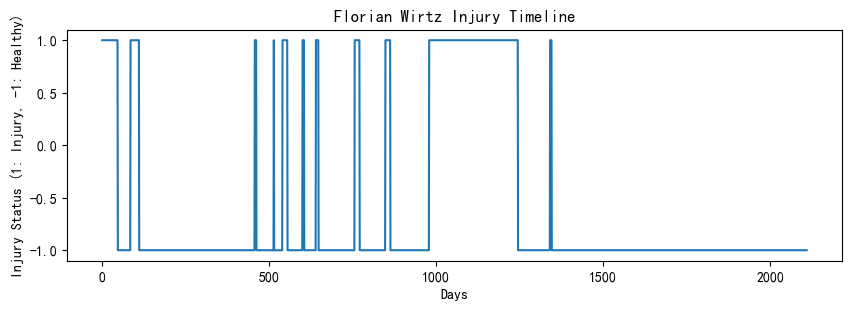

In [45]:
draw_timeline(1083)

D:\Programs\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 263 (\N{LATIN SMALL LETTER C WITH ACUTE}) missing from font(s) SimHei.
  fig.canvas.print_figure(bytes_io, **kw)


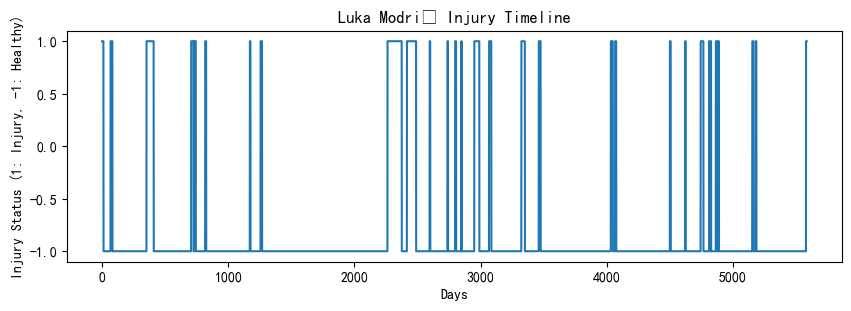

In [46]:
draw_timeline(558)

In [47]:
goalkeeper_df = df[df['position'].str.startswith('Goalkeeper', na=False)]
goalkeeper_df

,name,position,height/m,nationality,injury_history,apparence
0,Ederson,Goalkeeper,1.88,Brazil,"[-1, 30, 397, 3, 785, 17, 16, 7, 16, 9, 355, 1...","(495, 44035)"
1,Stefan Ortega,Goalkeeper,1.85,Germany,"[-1, 54, 447, 4, 101, 5, 2411, 28, 451, 8, 666...","(401, 35735)"
2,Scott Carson,Goalkeeper,1.88,England,"[-1, 9, 34, 17, 2837, 68]","(522, 46879)"
28,David Raya,Goalkeeper,1.83,Spain,"[-1, 103, 962, 5]","(422, 38160)"
29,Neto,Goalkeeper,1.90,Brazil,"[-1, 59, 655, 17, 1047, 15, 135, 38, 128, 23, ...","(330, 29665)"
52,Alisson,Goalkeeper,1.93,Brazil,"[-1, 16, 1039, 5, 445, 68, 137, 81, 124, 7, 6,...","(463, 41586)"
53,Caoimhín Kelleher,Goalkeeper,1.88,Ireland,"[-1, 11, 226, 106, 737, 4]","(119, 10800)"
54,Vitezslav Jaros,Goalkeeper,1.90,Czech Republic,"[-1, 169, 1516, 8]","(135, 12085)"
55,Harvey Davies,Goalkeeper,1.90,England,[-1],"(107, 9531)"
77,Robert Sánchez,Goalkeeper,1.97,Spain,"[-1, 17, 196, 67, 41, 66, 0, 8]","(240, 21515)"


### 绘制五个门将的伤病波形图

0


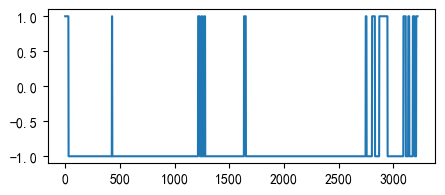

28


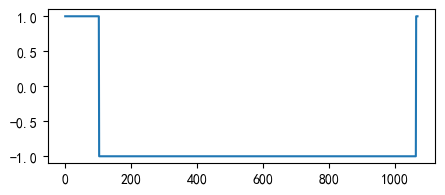

53


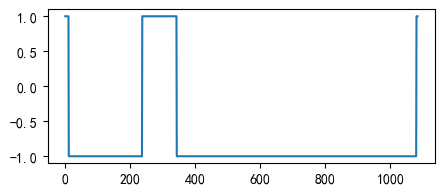

77


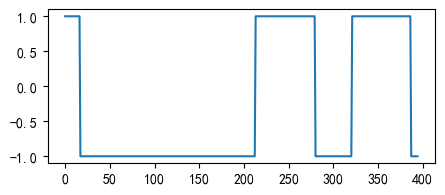

80


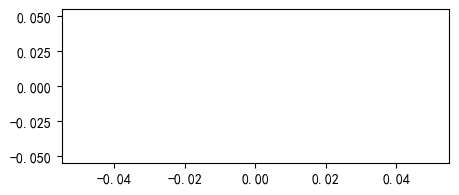

In [48]:
for i in goalkeeper_df.index[0::3][:5]:
    print(i)
    draw_timeline(i, show_labels=False)

<br>

# 3.
其他分析

In [49]:
df_statics = df.copy()

### 位置-人数统计

In [50]:
df.groupby("position")["name"].count()

position
Attacking Midfield    172
Central Midfield      320
Centre-Back           472
Centre-Forward        311
Defensive Midfield    201
Goalkeeper            303
Left Midfield          17
Left Winger           175
Left-Back             187
Right Midfield         22
Right Winger          169
Right-Back            220
Second Striker         22
Name: name, dtype: int64

In [51]:
category_map = {
    "Attacking Midfield": "Midfielder",
    "Central Midfield": "Midfielder",
    "Defensive Midfield": "Midfielder",
    "Left Midfield": "Midfielder",
    "Right Midfield": "Midfielder",
    "Centre-Back": "Defender",
    "Left-Back": "Defender",
    "Right-Back": "Defender",
    "Centre-Forward": "Attacker",
    "Left Winger": "Attacker",
    "Right Winger": "Attacker",
    "Second Striker": "Attacker",
    "Goalkeeper": "Goalkeeper",
}

# 新增一列 big_position，把具体位置映射为大类
df_statics["big_position"] = df["position"].map(category_map)

# 统计每个大类的人数
big_position_counts = df_statics.groupby("big_position")["name"].count().reset_index()
big_position_counts.columns = ["big_position", "player_count"]
big_position_counts

,big_position,player_count
0,Attacker,677
1,Defender,879
2,Goalkeeper,303
3,Midfielder,732


### 国籍-人数统计

In [52]:
df.groupby("nationality")["name"].count()

nationality
Albania                      10
Algeria                      17
Andorra                       1
Angola                        6
Argentina                    70
Armenia                       1
Australia                     8
Austria                      35
Belgium                      45
Benin                         2
Bosnia-Herzegovina           11
Brazil                       84
Burkina Faso                  5
Burundi                       1
Cameroon                     17
Canada                       11
Cape Verde                    3
Central African Republic      3
Chile                         4
Colombia                     19
Comoros                       1
Congo                         4
Costa Rica                    1
Cote d'Ivoire                43
Croatia                      35
Cyprus                        2
Czech Republic               16
DR Congo                     11
Denmark                      51
Dominican Republic            2
Ecuador                     

In [53]:
import plotly.express as px

nationality_counts = df.groupby("nationality")["name"].count().reset_index()
nationality_counts.columns = ["country", "player_count"]
replace_dict = {
    "Korea, South": "South Korea",
    "Cote d'Ivoire": "Ivory Coast",
    "Türkiye": "Turkey",
    "England": "United Kingdom", 
    "Scotland": "United Kingdom",
    "Wales": "United Kingdom",
    "Northern Ireland": "United Kingdom",
    # ...
}
nationality_counts["country"] = nationality_counts["country"].replace(replace_dict)
# 合并 UK 重复统计
nationality_counts = nationality_counts.groupby("country", as_index=False)["player_count"].sum()


# 显示世界地图
fig = px.choropleth(nationality_counts,
                    locations="country",
                    locationmode="country names",
                    color="player_count",
                    hover_name="country",
                    color_continuous_scale="Viridis_r",
                    title="Number of Players by Nationality")

fig.write_html("./saved/player_nationality_map.html")
fig.show()


### 各个位置国籍-人数统计

In [54]:
df.groupby("position")["nationality"].value_counts()

position            nationality             
Attacking Midfield  Spain                       25
                    Germany                     18
                    England                     17
                    France                      16
                    Italy                       13
                    Argentina                    9
                    Morocco                      5
                    Netherlands                  5
                    Belgium                      4
                    Croatia                      4
                    Portugal                     4
                    Austria                      3
                    Brazil                       3
                    Denmark                      3
                    Hungary                      3
                    Korea, South                 3
                    Nigeria                      3
                    Algeria                      2
                    Ghana            

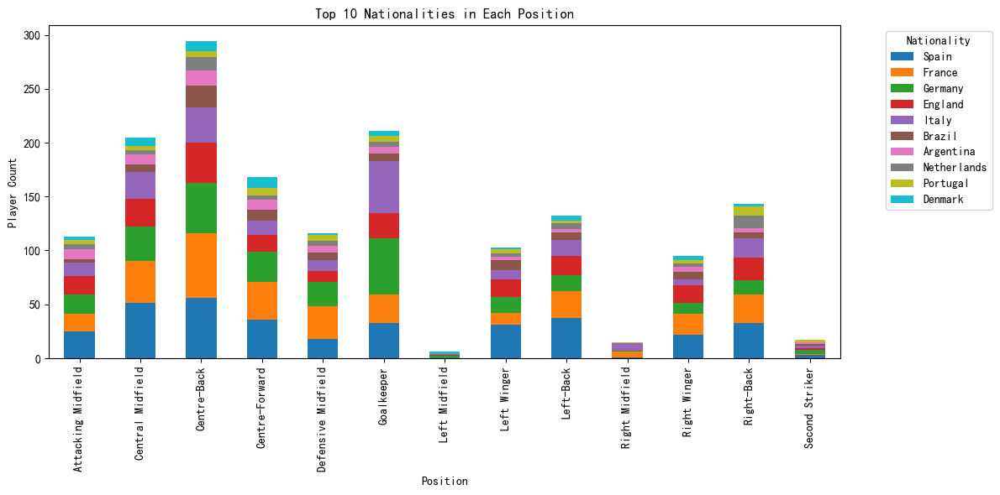

In [55]:
pos_nat_counts = df.groupby(["position", "nationality"]).size().unstack(fill_value=0)

# 选取前 N 个国籍（避免过于拥挤）
top_nationalities = pos_nat_counts.sum().sort_values(ascending=False).head(10).index
pos_nat_counts[top_nationalities].plot(kind='bar', stacked=True, figsize=(12, 6))

plt.title("Top 10 Nationalities in Each Position")
plt.xlabel("Position")
plt.ylabel("Player Count")
plt.legend(title="Nationality", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### 位置-身高统计

In [56]:
df.groupby("position")["height/m"].mean()

position
Attacking Midfield    1.790828
Central Midfield      1.815906
Centre-Back           1.885617
Centre-Forward        1.850912
Defensive Midfield    1.833650
Goalkeeper            1.908467
Left Midfield         1.817059
Left Winger           1.782690
Left-Back             1.795561
Right Midfield        1.803182
Right Winger          1.781310
Right-Back            1.804633
Second Striker        1.798636
Name: height/m, dtype: float64

### 位置-出场数统计

In [57]:
df_statics["matches_played"] = df["apparence"].apply(lambda x: eval(str(x))[0])
df_statics.groupby("position")["matches_played"].mean()

position
Attacking Midfield    238.639535
Central Midfield      265.706250
Centre-Back           241.809322
Centre-Forward        268.488746
Defensive Midfield    268.587065
Goalkeeper            245.320132
Left Midfield         221.705882
Left Winger           235.811429
Left-Back             253.887701
Right Midfield        259.000000
Right Winger          241.390533
Right-Back            274.809091
Second Striker        323.636364
Name: matches_played, dtype: float64

### 位置-伤病次数统计

In [58]:
def injury_count(inj_list):
    l = len(inj_list)
    if l == 1:
        return 0
    return  l/2 # 每个伤病可能是两个值一组（类型+天数）

df_statics["injury_count"] = df["injury_history"].apply(injury_count)
injury_series = df_statics.groupby("position")["injury_count"].mean()
injury_series

position
Attacking Midfield     6.941860
Central Midfield       7.731250
Centre-Back            7.947034
Centre-Forward         7.630225
Defensive Midfield     7.019900
Goalkeeper             4.382838
Left Midfield          8.294118
Left Winger            7.440000
Left-Back              8.090909
Right Midfield         6.954545
Right Winger           6.739645
Right-Back             7.822727
Second Striker        11.045455
Name: injury_count, dtype: float64

In [59]:
df[df['position'].str.startswith('Second Striker', na=False)]

,name,position,height/m,nationality,injury_history,apparence
398,Matheus Cunha,Second Striker,1.83,Brazil,"[-1, 4, 55, 15, 58, 14, 213, 6, 45, 16, 56, 35...","(271, 16289)"
480,Conor Chaplin,Second Striker,1.68,England,"[-1, 58, 0, 17]","(409, 23079)"
762,Peque Fernández,Second Striker,1.72,Spain,"[-1, 68, 17, 75, 335, 14, 29, 13]","(146, 7196)"
859,Iker Losada,Second Striker,1.75,Spain,[-1],"(181, 10505)"
986,Isi Palazón,Second Striker,1.69,Spain,[-1],"(392, 24824)"
1062,Thomas Müller,Second Striker,1.85,Germany,"[-1, 11, 259, 1, 161, 5, 385, 4, 112, 5, 196, ...","(839, 60381)"
1063,Gabriel Vidovic,Second Striker,1.80,Croatia,"[-1, 5, 677, 66]","(129, 7053)"
1171,Nick Woltemade,Second Striker,1.98,Germany,"[-1, 33, 59, 61, 38, 13, 79, 86, 594, 5, 532, 4]","(175, 10545)"
1260,Adam Hlozek,Second Striker,1.88,Czech Republic,"[-1, 8, 388, 8, 28, 8, 11, 134, 73, 8, 158, 18...","(260, 16942)"
1290,Maximilian Philipp,Second Striker,1.83,Germany,"[-1, 1, 35, 22, 7, 25, 74, 1, 10, 12, 143, 5, ...","(373, 22322)"


二前锋的受伤频率非常高<br>
我分析，二前锋一般都是队伍内核心，所以有大量的出场时间，导致总体平均值偏高。

In [60]:
df_statics.groupby("big_position")["injury_count"].mean()

big_position
Attacker      7.469719
Defender      7.946530
Goalkeeper    4.382838
Midfielder    7.340164
Name: injury_count, dtype: float64

### 位置-场均出场时间统计

In [61]:
df_statics["minutes_played"] = df["apparence"].apply(lambda x: x[1]/x[0])
minutes_series = df_statics.groupby("position")["minutes_played"].mean()
minutes_series

position
Attacking Midfield    63.287535
Central Midfield      65.855628
Centre-Back           79.090577
Centre-Forward        59.786346
Defensive Midfield    69.847632
Goalkeeper            89.403645
Left Midfield         64.342397
Left Winger           59.918452
Left-Back             73.010373
Right Midfield        67.449628
Right Winger          60.033878
Right-Back            72.720107
Second Striker        60.268516
Name: minutes_played, dtype: float64

In [62]:
df_statics.groupby("big_position")["minutes_played"].mean()

big_position
Attacker      59.897955
Defender      76.202634
Goalkeeper    89.403645
Midfielder    66.361125
Name: minutes_played, dtype: float64

### 场均出场时间-受伤频率双变量对比

C:\Users\26746\AppData\Local\Temp\ipykernel_27372\2754460812.py:26: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



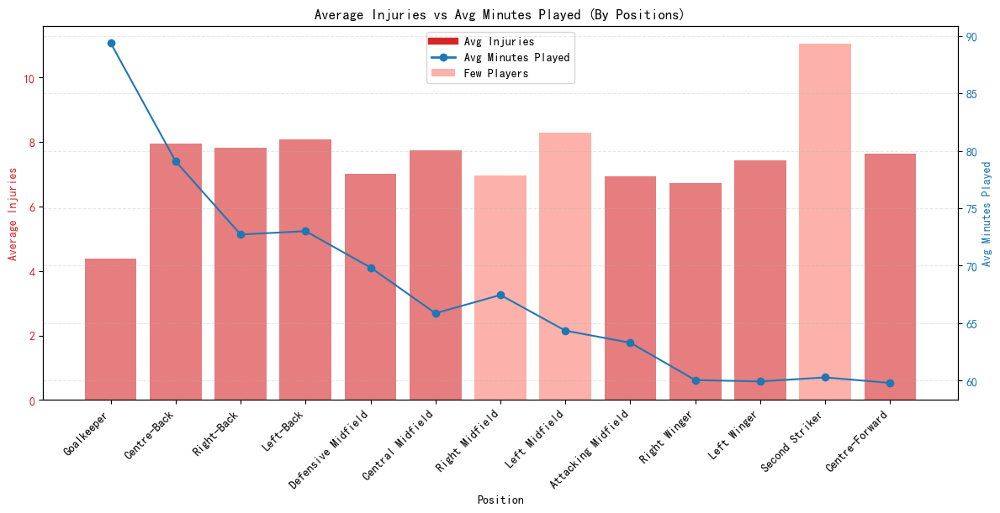

In [63]:
position_order = [
    "Goalkeeper", "Centre-Back", 
    "Right-Back", "Left-Back",
    "Defensive Midfield", "Central Midfield", "Right Midfield", "Left Midfield",
    "Attacking Midfield", "Right Winger", "Left Winger", 
    "Second Striker", "Centre-Forward"
]

injury_series_ordered = injury_series[position_order]
minutes_series_ordered = minutes_series[position_order]

# 定义球员数量过少的位置
few_players_positions = ["Left Midfield", "Right Midfield", "Second Striker"]

# 创建新的颜色列表：浅红色表示球员数量太少，其余为红色
bar_colors = ['salmon' if pos in few_players_positions else 'tab:red' for pos in position_order]

# 重新绘图，突出标示球员数少的位置
fig, ax1 = plt.subplots(figsize=(12, 6))

# 柱状图：平均受伤次数
ax1.set_xlabel('Position')
ax1.set_ylabel('Average Injuries', color='tab:red')
bars = ax1.bar(position_order, injury_series_ordered, color=bar_colors, alpha=0.6)
ax1.tick_params(axis='y', labelcolor='tab:red')
ax1.set_xticklabels(position_order, rotation=45, ha='right')

# 折线图：场均出场时间
ax2 = ax1.twinx()
ax2.set_ylabel('Avg Minutes Played', color='tab:blue')
line = ax2.plot(position_order, minutes_series_ordered, color='tab:blue', marker='o', label='Avg Minutes Played')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# 图例手动添加
custom_legend = [
    plt.Line2D([0], [0], color='tab:red', lw=6, label='Avg Injuries'),
    plt.Line2D([0], [0], color='tab:blue', lw=2, marker='o', label='Avg Minutes Played'),
    plt.Rectangle((0, 0), 1, 1, fc='salmon', alpha=0.6, label='Few Players')
]
ax1.legend(handles=custom_legend, loc='upper center')

# 标题与布局
fig.tight_layout()
plt.title('Average Injuries vs Avg Minutes Played (By Positions)')
plt.grid(True, which='both', axis='y', linestyle='--', alpha=0.3)
plt.show()

图中从左到右为球场上的位置从前到后。

其中左右边前卫和二前锋因为人数偏少，都标成浅红色的了。

场均时间如折线显示，位置从前到后依次减少。因为轮换都是换的前场球员。

伤病次数除了门将位置都差不多。

前锋相对后卫伤病略少，或许是因为有轮换。

### 每个位置受伤最多球员

In [64]:
df_sorted_statics = df_statics.sort_values("injury_count")
df_sorted_statics.groupby("position").apply(
    lambda g: g.sort_values("injury_count", ascending=False).head(5)
)[["name", "injury_count"]]


C:\Users\26746\AppData\Local\Temp\ipykernel_27372\3264477378.py:2: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



name  injury_count
position                                                  
Attacking Midfield 1196          Mario Götze          52.0
                   1690   Lorenzo Pellegrini          33.0
                   17        Kevin De Bruyne          27.0
                   506          Adam Lallana          26.0
                   2153    Aleksandr Golovin          26.0
Central Midfield   1056        Leon Goretzka          47.0
                   1108          Kevin Kampl          46.0
                   1254        Dennis Geiger          38.0
                   1134      Marcel Sabitzer          37.0
                   1828        Sergi Roberto          36.0
Centre-Back        1678         Mats Hummels          71.0
                   548           David Alaba          46.0
                   1404           Kevin Vogt          42.0
                   595    José María Giménez          41.0
                   1348         Niklas Stark          37.0
Centre-Forward     1567     Marko Arnautovic          40.0
                   2237  Alexandre Lacazette          36.0
                   1871      Mario Balotelli          36.0
                   1960      Pietro Pellegri          33.0
                   1901       Alexis Sánchez          33.0
Defensive Midfield 1001   Florian Grillitsch          40.0
                   1555     Hakan Çalhanoğlu          31.0
                   1858         Milan Badelj          29.0
                   1130             Emre Can          25.0
                   2416     Francis Coquelin          24.0
Goalkeeper         1040         Manuel Neuer          35.0
                   1177          Kevin Trapp          23.0
                   542      Thibaut Courtois          23.0
                   1117         Gregor Kobel          22.0
                   792      Jasper Cillessen          22.0
Left Midfield      1800           Borna Sosa          33.0
                   1801     Valentino Lazaro          19.0
                   2039         Jakub Jankto          18.0
                   1983        Darko Lazović          13.0
                   1416          Robert Skov          13.0
Left Winger        1058       Kingsley Coman          49.0
                   1059         Serge Gnabry          42.0
                   2074           Ante Rebić          39.0
                   130           Timo Werner          34.0
                   1666          Noah Okafor          29.0
Left-Back          1049    Raphaël Guerreiro          41.0
                   35    Oleksandr Zinchenko          31.0
                   148             Luke Shaw          29.0
                   1656  Leonardo Spinazzola          28.0
                   696             José Gayà          27.0
Right Midfield     1638    Davide Zappacosta          24.0
                   1640        Juan Cuadrado          21.0
                   1717       Manuel Lazzari          20.0
                   2368        Romain Faivre          13.0
                   1798      Marcus Pedersen          10.0
Right Winger       1726                Pedro          32.0
                   1615    Christian Pulisic          31.0
                   1061           Leroy Sané          23.0
                   74        Federico Chiesa          23.0
                   212           Leon Bailey          22.0
Right-Back         1946    Mattia De Sciglio          37.0
                   2174       Thomas Meunier          33.0
                   1739      Davide Calabria          32.0
                   1607  Alessandro Florenzi          30.0
                   1382          Marius Wolf          30.0
Second Striker     1695         Paulo Dybala          36.0
                   1563       Joaquín Correa          25.0
                   1062        Thomas Müller          21.0
                   1290   Maximilian Philipp          20.0
                   2021     Gianluca Caprari          18.0

In [65]:
df_statics

,name,position,height/m,nationality,injury_history,apparence,big_position,matches_played,injury_count,minutes_played
0,Ederson,Goalkeeper,1.88,Brazil,"[-1, 30, 397, 3, 785, 17, 16, 7, 16, 9, 355, 1...","(495, 44035)",Goalkeeper,495,13.0,88.959596
1,Stefan Ortega,Goalkeeper,1.85,Germany,"[-1, 54, 447, 4, 101, 5, 2411, 28, 451, 8, 666...","(401, 35735)",Goalkeeper,401,6.0,89.114713
2,Scott Carson,Goalkeeper,1.88,England,"[-1, 9, 34, 17, 2837, 68]","(522, 46879)",Goalkeeper,522,3.0,89.806513
3,Rúben Dias,Centre-Back,1.87,Portugal,"[-1, 29, 95, 11, 1435, 40, 255, 25, 654, 33, 1...","(425, 36453)",Defender,425,8.0,85.771765
4,Abdukodir Khusanov,Centre-Back,1.86,Uzbekistan,[-1],"(78, 6292)",Defender,78,0.0,80.666667
5,Nathan Aké,Centre-Back,1.80,Netherlands,"[-1, 36, 982, 13, 330, 7, 143, 2, 341, 35, 30,...","(363, 28028)",Defender,363,18.0,77.212121
6,Manuel Akanji,Centre-Back,1.88,Switzerland,"[-1, 40, 65, 302, 648, 23, 10, 9, 10, 7, 14, 1...","(444, 36883)",Defender,444,19.0,83.069820
7,John Stones,Centre-Back,1.88,England,"[-1, 67, 284, 25, 767, 43, 94, 29, 56, 5, 230,...","(412, 31401)",Defender,412,21.0,76.216019
8,Vitor Reis,Centre-Back,1.86,Brazil,"[-1, 24]","(42, 3303)",Defender,42,1.0,78.642857
9,Josko Gvardiol,Left-Back,1.85,Croatia,"[-1, 22, 45, 36, 322, 8, 359, 8, 29, 27, 219, 23]","(250, 19815)",Defender,250,6.0,79.260000
